Start by performing all steps we made in previous notebook to define and visualize graph frame

In [0]:
import networkx as nx
import matplotlib.pyplot as plt

from functools import reduce
from graphframes import GraphFrame
from pyspark.sql.functions import col, lit

In [0]:
vertices = spark.createDataFrame([("NYC", "New York City", 103),
                                  ("EUG", "Eugene", 65),
                                  ("AMW", "Ames", 35),
                                  ("AUS", "Austin", 46),
                                  ("BOS", "Boston", 57),
                                  ("SEA", "Seattle", 10),
                                  ("SFO", "San Francisco", 10),
                                  ("RDM", "Bend", 70),
                                  ("PDX", "Portland", 3)], ["id", "airport_name", "total_flights"])

In [0]:
edges = spark.createDataFrame([("NYC", "EUG", 33),
                               ("EUG", "AMW", -10),
                               ("AMW", "EUG", 0),
                               ("PDX", "AMW", 0),
                               ("BOS", "NYC", 44),
                               ("NYC", "BOS", 18),
                               ("NYC", "SFO", 9),
                               ("AUS", "PDX", -5),
                               ("BOS", "PDX", 3),
                               ("RDM", "PDX", -2),
                               ("SEA", "SFO", 5),
                               ("RDM", "SEA", 10),
                               ("SEA", "NYC", 35),
                               ("SFO", "RDM", 25)], ["src", "dst", "delay"])

In [0]:
flight_routes = GraphFrame(vertices, edges)

In [0]:
def plot_directed_graph(gf):
  
  gplot = nx.DiGraph()
  edge_labels = {}
  
  plt.figure(figsize=(6, 7))
  for node in gf.vertices.select('id').take(1000):
    gplot.add_node(node['id'])

  for row in gf.edges.select('src', 'dst', 'delay').take(1000):
    gplot.add_edge(row['src'], row['dst'])
    edge_labels[(row['src'], row['dst'])] = row['delay']
       
  pos = nx.shell_layout(gplot)
  
  nx.draw(gplot,
          pos,
          with_labels=True, 
          font_weight='bold', 
          node_size=1800, 
          font_size=15, 
          width=2)
    
  nx.draw_networkx_edge_labels(gplot,
                               pos,
                               edge_labels=edge_labels,
                               font_color='green',
                               font_size=10,
                               font_weight='bold')

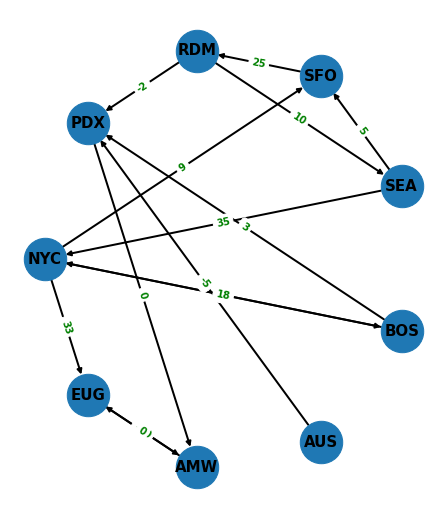

In [0]:
plot_directed_graph(flight_routes)

In [0]:
# find our first motif on this graph frame: find pairs of vertices () connected by edges []. The output is dataframe, containing 14 rows, as our # graph above shows 14 edges (connections). here (a) represents "src", (b) represents "dst"
direct_flights = flight_routes.find("(a)-[e]->(b)")

direct_flights.display()

a,e,b
"List(NYC, New York City, 103)","List(NYC, EUG, 33)","List(EUG, Eugene, 65)"
"List(AMW, Ames, 35)","List(AMW, EUG, 0)","List(EUG, Eugene, 65)"
"List(SEA, Seattle, 10)","List(SEA, NYC, 35)","List(NYC, New York City, 103)"
"List(BOS, Boston, 57)","List(BOS, NYC, 44)","List(NYC, New York City, 103)"
"List(PDX, Portland, 3)","List(PDX, AMW, 0)","List(AMW, Ames, 35)"
"List(EUG, Eugene, 65)","List(EUG, AMW, -10)","List(AMW, Ames, 35)"
"List(NYC, New York City, 103)","List(NYC, BOS, 18)","List(BOS, Boston, 57)"
"List(RDM, Bend, 70)","List(RDM, SEA, 10)","List(SEA, Seattle, 10)"
"List(SFO, San Francisco, 10)","List(SFO, RDM, 25)","List(RDM, Bend, 70)"
"List(RDM, Bend, 70)","List(RDM, PDX, -2)","List(PDX, Portland, 3)"


In [0]:
# it's more intuitive to use column names in the Domain Specific Language:
direct_flights = flight_routes.find("(source)-[edge]->(destination)")

direct_flights.display()

source,edge,destination
"List(NYC, New York City, 103)","List(NYC, EUG, 33)","List(EUG, Eugene, 65)"
"List(AMW, Ames, 35)","List(AMW, EUG, 0)","List(EUG, Eugene, 65)"
"List(SEA, Seattle, 10)","List(SEA, NYC, 35)","List(NYC, New York City, 103)"
"List(BOS, Boston, 57)","List(BOS, NYC, 44)","List(NYC, New York City, 103)"
"List(PDX, Portland, 3)","List(PDX, AMW, 0)","List(AMW, Ames, 35)"
"List(EUG, Eugene, 65)","List(EUG, AMW, -10)","List(AMW, Ames, 35)"
"List(NYC, New York City, 103)","List(NYC, BOS, 18)","List(BOS, Boston, 57)"
"List(RDM, Bend, 70)","List(RDM, SEA, 10)","List(SEA, Seattle, 10)"
"List(SFO, San Francisco, 10)","List(SFO, RDM, 25)","List(RDM, Bend, 70)"
"List(RDM, Bend, 70)","List(RDM, PDX, -2)","List(PDX, Portland, 3)"


In [0]:
# perform additional operations on the dataframe objects and it's properties
direct_flights.select('source.airport_name', 'destination.airport_name', 'edge.delay').display()

airport_name,airport_name,delay
New York City,Eugene,33
Ames,Eugene,0
Seattle,New York City,35
Boston,New York City,44
Portland,Ames,0
Eugene,Ames,-10
New York City,Boston,18
Bend,Seattle,10
San Francisco,Bend,25
Bend,Portland,-2


In [0]:
# ommit some information in the resulting dataframe. Ommit edges
direct_connection = flight_routes.find("(source)-[]->(destination)")

direct_connection.display()


source,destination
"List(NYC, New York City, 103)","List(EUG, Eugene, 65)"
"List(AMW, Ames, 35)","List(EUG, Eugene, 65)"
"List(SEA, Seattle, 10)","List(NYC, New York City, 103)"
"List(BOS, Boston, 57)","List(NYC, New York City, 103)"
"List(PDX, Portland, 3)","List(AMW, Ames, 35)"
"List(EUG, Eugene, 65)","List(AMW, Ames, 35)"
"List(NYC, New York City, 103)","List(BOS, Boston, 57)"
"List(RDM, Bend, 70)","List(SEA, Seattle, 10)"
"List(SFO, San Francisco, 10)","List(RDM, Bend, 70)"
"List(RDM, Bend, 70)","List(PDX, Portland, 3)"


In [0]:
# perform filtering
direct_connection.filter('source.id = "SEA"').display()

source,destination
"List(SEA, Seattle, 10)","List(NYC, New York City, 103)"
"List(SEA, Seattle, 10)","List(SFO, San Francisco, 10)"


In [0]:
# ommit destination
outgoing_flights = flight_routes.find("(source)-[edge]->()")

outgoing_flights.display()

source,edge
"List(AMW, Ames, 35)","List(AMW, EUG, 0)"
"List(AUS, Austin, 46)","List(AUS, PDX, -5)"
"List(BOS, Boston, 57)","List(BOS, NYC, 44)"
"List(BOS, Boston, 57)","List(BOS, PDX, 3)"
"List(EUG, Eugene, 65)","List(EUG, AMW, -10)"
"List(NYC, New York City, 103)","List(NYC, EUG, 33)"
"List(NYC, New York City, 103)","List(NYC, BOS, 18)"
"List(NYC, New York City, 103)","List(NYC, SFO, 9)"
"List(PDX, Portland, 3)","List(PDX, AMW, 0)"
"List(RDM, Bend, 70)","List(RDM, PDX, -2)"


In [0]:
# perform grouping and aggregation
outgoing_flights.groupby('source.airport_name').agg({'edge.delay': 'avg'}).display()

airport_name,avg(edge.delay AS delay)
Bend,4.0
San Francisco,25.0
Ames,0.0
Portland,0.0
Austin,-5.0
Seattle,20.0
New York City,20.0
Eugene,-10.0
Boston,23.5


In [0]:
# ommit source
incoming_flights = flight_routes.find("()-[edge]->(destination)")

incoming_flights.display()

edge,destination
"List(EUG, AMW, -10)","List(AMW, Ames, 35)"
"List(PDX, AMW, 0)","List(AMW, Ames, 35)"
"List(NYC, BOS, 18)","List(BOS, Boston, 57)"
"List(NYC, EUG, 33)","List(EUG, Eugene, 65)"
"List(AMW, EUG, 0)","List(EUG, Eugene, 65)"
"List(BOS, NYC, 44)","List(NYC, New York City, 103)"
"List(SEA, NYC, 35)","List(NYC, New York City, 103)"
"List(AUS, PDX, -5)","List(PDX, Portland, 3)"
"List(BOS, PDX, 3)","List(PDX, Portland, 3)"
"List(RDM, PDX, -2)","List(PDX, Portland, 3)"


In [0]:
incoming_flights.groupby('destination.airport_name').agg({'edge.delay': 'avg'}).display()

airport_name,avg(edge.delay AS delay)
Bend,25.0
San Francisco,7.0
Ames,-5.0
Portland,-1.3333333333333333
Seattle,10.0
New York City,39.5
Eugene,16.5
Boston,18.0


In [0]:
# specify negated pattern: where there is no connection betweer "src" and "dst". Note that here [edge] has to be empty !!!
no_flights = flight_routes.find("!(source)-[]->(destination)")

no_flights.display()

source,destination
"List(NYC, New York City, 103)","List(NYC, New York City, 103)"
"List(EUG, Eugene, 65)","List(NYC, New York City, 103)"
"List(EUG, Eugene, 65)","List(EUG, Eugene, 65)"
"List(AUS, Austin, 46)","List(NYC, New York City, 103)"
"List(AUS, Austin, 46)","List(EUG, Eugene, 65)"
"List(AMW, Ames, 35)","List(NYC, New York City, 103)"
"List(BOS, Boston, 57)","List(EUG, Eugene, 65)"
"List(SEA, Seattle, 10)","List(EUG, Eugene, 65)"
"List(PDX, Portland, 3)","List(NYC, New York City, 103)"
"List(SFO, San Francisco, 10)","List(NYC, New York City, 103)"


In [0]:
# if you try to run the query above with [edge], that in fact shouldnt exist: "org.graphframes.InvalidParseException: Motif finding does not 
# support negated named edges"
#no_flights = flight_routes.find("!(source)-[edge]->(destination)")

#no_flights.display()

In [0]:
# also completely empty pattern returns an error
#anywhere_to_anywhere = flight_routes.find("()-[]->()")

#anywhere_to_anywhere.display()

#### Working on real-world dataset

In [0]:
# dataset will be loaded from databriks examples
flight_data = spark.read.format("csv") \
                        .option("header", "true") \
                        .option("inferSchema", "true") \
                        .load("/databricks-datasets/asa/airlines/2005.csv")

flight_data.display()

Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
2005,1,28,5,1603,1605,1741,1759,UA,541,N935UA,158,174,131,-18,-2,BOS,ORD,867,4,23,0,null,0,0,0,0,0,0
2005,1,29,6,1559,1605,1736,1759,UA,541,N941UA,157,174,136,-23,-6,BOS,ORD,867,6,15,0,null,0,0,0,0,0,0
2005,1,30,7,1603,1610,1741,1805,UA,541,N342UA,158,175,131,-24,-7,BOS,ORD,867,9,18,0,null,0,0,0,0,0,0
2005,1,31,1,1556,1605,1726,1759,UA,541,N326UA,150,174,129,-33,-9,BOS,ORD,867,11,10,0,null,0,0,0,0,0,0
2005,1,2,7,1934,1900,2235,2232,UA,542,N902UA,121,152,106,3,34,ORD,BOS,867,5,10,0,null,0,0,0,0,0,0
2005,1,3,1,2042,1900,9,2232,UA,542,N904UA,147,152,97,97,102,ORD,BOS,867,3,47,0,null,0,23,0,0,0,74
2005,1,4,2,2046,1900,2357,2232,UA,542,N942UA,131,152,100,85,106,ORD,BOS,867,5,26,0,null,0,46,0,0,0,39
2005,1,5,3,NA,1900,NA,2232,UA,542,000000,NA,152,NA,NA,NA,ORD,BOS,867,0,0,1,B,0,0,0,0,0,0
2005,1,6,4,2110,1900,8,2223,UA,542,N920UA,118,143,101,105,130,ORD,BOS,867,2,15,0,null,0,16,0,0,0,89
2005,1,7,5,1859,1900,2235,2223,UA,542,N340UA,156,143,96,12,-1,ORD,BOS,867,4,56,0,null,0,0,0,0,0,0


In [0]:
# get the vertices (nodes) for our graph frame: 
origins = flight_data.select('Origin').distinct().withColumnRenamed('Origin', 'City')

origins.count()

Out[21]: 286

In [0]:
destinations = flight_data.select('Dest').distinct().withColumnRenamed('Dest', 'City')

destinations.count()

Out[22]: 289

In [0]:
# create vertices. UNION selects all distinct cities
vertices = origins.union(destinations).select('City').distinct().withColumnRenamed('City', 'id')

vertices.count()

Out[23]: 290

In [0]:
vertices.display()

id
BGM
DLG
PSE
MSY
GEG
BUR
SNA
GRB
GTF
IDA


In [0]:
# extract routes
routes = flight_data.select('Origin', 'Dest', 'AirTime', 'ArrDelay', 'DepDelay', 'Cancelled', 'Diverted')

routes.display()

Origin,Dest,AirTime,ArrDelay,DepDelay,Cancelled,Diverted
BOS,ORD,131,-18,-2,0,0
BOS,ORD,136,-23,-6,0,0
BOS,ORD,131,-24,-7,0,0
BOS,ORD,129,-33,-9,0,0
ORD,BOS,106,3,34,0,0
ORD,BOS,97,97,102,0,0
ORD,BOS,100,85,106,0,0
ORD,BOS,NA,NA,NA,1,0
ORD,BOS,101,105,130,0,0
ORD,BOS,96,12,-1,0,0


In [0]:
# give a proper names, that Graph is expecting
edges = routes.withColumnRenamed('Origin', 'src')\
              .withColumnRenamed('Dest', 'dst')

edges.display()

src,dst,AirTime,ArrDelay,DepDelay,Cancelled,Diverted
BOS,ORD,131,-18,-2,0,0
BOS,ORD,136,-23,-6,0,0
BOS,ORD,131,-24,-7,0,0
BOS,ORD,129,-33,-9,0,0
ORD,BOS,106,3,34,0,0
ORD,BOS,97,97,102,0,0
ORD,BOS,100,85,106,0,0
ORD,BOS,NA,NA,NA,1,0
ORD,BOS,101,105,130,0,0
ORD,BOS,96,12,-1,0,0


In [0]:
# instanciate GraphFrame
us_flight_routes = GraphFrame(vertices, edges)

In [0]:
# find following motif
us_direct_flights = us_flight_routes.find("(source)-[edge]->(destination)")

us_direct_flights.display()

source,edge,destination
List(BGM),"List(BGM, CVG, 80, -18, 0, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 80, -14, 0, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 92, -9, 5, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 87, -21, -6, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 85, -17, -5, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 87, 8, 0, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, NA, NA, NA, 1, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 91, 21, 13, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 106, 9, 0, 0, 0)",List(CVG)
List(BGM),"List(BGM, CVG, 96, -5, 0, 0, 0)",List(CVG)


In [0]:
# perform query
us_direct_flights.filter('source.id = "PIT"').select('destination.id', 'edge.AirTime').display()

id,AirTime
MSY,NA
MSY,NA
MSY,NA
MSY,NA
MSY,NA
MSY,NA
MSY,NA
MSY,NA
MSY,NA
MSY,NA


In [0]:
us_direct_flights.filter('source.id = "SFO" and edge.ArrDelay < 30').select('destination.id', 'edge.ArrDelay').display()

id,ArrDelay
MSY,-9
MSY,-2
MSY,-12
MSY,5
MSY,-4
MSY,-6
MSY,-9
MSY,-8
MSY,5
MSY,-11


In [0]:
us_direct_flights.groupby('source.id', 'destination.id').sum('edge.Cancelled').display()

id,id,sum(edge.Cancelled AS Cancelled)
BGM,CVG,48
DLG,ANC,11
PSE,JFK,1
MSY,CLT,64
MSY,MIA,45
MSY,ORD,88
MSY,IAD,23
MSY,DTW,30
MSY,TPA,35
MSY,MCO,36


####More complex Motif patterns of the Domain Specific Language

In [0]:
# this is pattern of union of edges:  for A->B->C (one-stop flight)
# ! note that this annotation included source == final_destination (A==C)
one_hop_flights = us_flight_routes.find("(source)-[edge_1]->(destination_1); (destination_1)-[edge_2]->(final_destination)")

one_hop_flights.display()

source,edge_1,destination_1,edge_2,final_destination
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 44, -8, -5, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 37, -19, -10, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 39, -4, -3, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 43, 10, 0, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 40, 57, 59, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 40, 13, 0, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 40, 10, 15, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 36, 30, 45, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 46, 48, 39, 0, 0)",List(IAH)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, IAH, 39, 15, 16, 0, 0)",List(IAH)


In [0]:
# to eliminate cases where source == final_destination from result of the above query:
one_hop_flights.filter('source.id != final_destination.id').display()

source,edge_1,destination_1,edge_2,final_destination
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 34, -2, -6, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 34, -6, -4, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 40, 3, -8, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 32, -7, -11, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 30, 338, 349, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 30, 12, -5, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 35, 0, -4, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 31, 2, 0, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 30, 5, -9, 0, 0)",List(DFW)
List(IAH),"List(IAH, ACT, 52, 1, -5, 0, 0)",List(ACT),"List(ACT, DFW, 34, 6, -6, 0, 0)",List(DFW)


In [0]:
# define an explicit return flight pattern
return_flights = us_flight_routes.find("(source)-[edge_1]->(destination); (destination)-[edge_2]->(source)")

return_flights.display()

source,edge_1,destination,edge_2
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 65, -4, -10, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 61, -5, -4, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 58, -5, -11, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 63, 1, -5, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 64, 3, -5, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 61, 108, 105, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 64, 1, -10, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 56, 15, 17, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 67, -4, -9, 0, 0)"
List(CLE),"List(CLE, ABE, 47, -13, -7, 0, 0)",List(ABE),"List(ABE, CLE, 57, 16, -10, 0, 0)"


In [0]:
#filtering on multiple conditions
return_flights.filter('edge_1.AirTime < 30 and edge_2.AirTime < 30')\
              .select('source.id', 'destination.id', 'edge_1.AirTime', 'edge_2.AirTime').display()

id,id,AirTime,AirTime
OXR,LAX,15,15
OXR,LAX,18,15
OXR,LAX,15,15
OXR,LAX,20,15
OXR,LAX,20,15
OXR,LAX,16,15
OXR,LAX,20,15
OXR,LAX,20,15
OXR,LAX,18,15
OXR,LAX,16,15


In [0]:
# union of edges: no return flight
no_return_flights = us_flight_routes.find("(source)-[edge_1]->(destination); !(destination)-[]->(source)")

no_return_flights.display()

source,edge_1,destination
List(KOA),"List(KOA, ORD, 446, 49, 58, 0, 0)",List(ORD)
List(KOA),"List(KOA, SEA, 289, -34, -6, 0, 0)",List(SEA)
List(AKN),"List(AKN, DLG, 21, 4, 4, 0, 0)",List(DLG)
List(KOA),"List(KOA, SEA, 308, -10, -2, 0, 0)",List(SEA)
List(KOA),"List(KOA, ORD, 474, 6, -8, 0, 0)",List(ORD)
List(ANC),"List(ANC, OGG, 329, -2, 0, 0, 0)",List(OGG)
List(ORD),"List(ORD, STT, 256, 8, 3, 0, 0)",List(STT)
List(AKN),"List(AKN, DLG, 15, -17, -8, 0, 0)",List(DLG)
List(DEN),"List(DEN, IDA, NA, NA, -2, 0, 1)",List(IDA)
List(TLH),"List(TLH, MCO, 41, -2, 0, 0, 0)",List(MCO)
